# Simple SSD on PennFudan

**Goal:** Implement and train simple network for detecting people on an image.
****
**Author:** Paweł Subko. Please send questions regarding this task to: P.Subko@mimuw.edu.pl .
****
**Deliverables:**

1. Jupyter notebook with the best result. Please keep all the logs in the jupyter notebook.

2. Short report describing how you solved key problems of the assignment (balancing classes, choosing anchors, parameters you trained with).

3. The best model in terms of metrics in *.ckpt format.
****



## Overview

In this task, **FOR THE TOTAL OF 10 points** one should (for details read text in the notebook):
- determine the size of the feasible anchors for the object detection task posed in this Assignment,
- build an object detection model using the variant of `SSD` with EfficientNet backbone,
- fill in gaps in implementation,
- train model and achive at least 55% mean average precision on test dataloader

Hints and comments:

- model architecture and loss are heavily, yet loosely inspired by [SSD](https://arxiv.org/abs/1512.02325) paper and by [Pytorch Implementation](https://github.com/NVIDIA/DeepLearningExamples/tree/master/PyTorch/Detection/SSD)

- be sure that you understand the concept of an anchor for object detection, covered during the lecture about Object Detection. There are many great tutorials and articles about it (e.g. [this](https://towardsdatascience.com/anchor-boxes-the-key-to-quality-object-detection-ddf9d612d4f9) one).

## Data description
Similar to [pytorch object detection finetuning tutorial](https://pytorch.org/tutorials/intermediate/torchvision_tutorial.html) we use PennFudan dataset. It has only one clas and for simplicity our implementation takes adventage of it. This dataset also contains other descriptors we ignore.

* Note1: Tip: to debug write tests or fast dev run/overfit, not the full training!
* Note2: `(H, W)` may correspond to height and width of original image or to spatial dimensions of tensor obtained by processing image, but possibly downsampled. Usually, it's clear from the context.
* Note3: Regarding sending tensors `.to(device=DEVICE)` <- you must apply it to every tensor you explicitly create outside of LightningModule. Other tensors are handled by pytorch_lightning.
* Note4: "Test" and "Valid" are used interchangeably.

# Prerequisites:

In [1]:
!wget https://www.cis.upenn.edu/~jshi/ped_html/PennFudanPed.zip

--2022-05-06 07:31:37--  https://www.cis.upenn.edu/~jshi/ped_html/PennFudanPed.zip
Resolving www.cis.upenn.edu (www.cis.upenn.edu)... 158.130.69.163, 2607:f470:8:64:5ea5::d
Connecting to www.cis.upenn.edu (www.cis.upenn.edu)|158.130.69.163|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 53723336 (51M) [application/zip]
Saving to: ‘PennFudanPed.zip’

PennFudanPed.zip    100%[===================>]  51.23M  57.7MB/s    in 0.9s    

2022-05-06 07:31:38 (57.7 MB/s) - ‘PennFudanPed.zip’ saved [53723336/53723336]



In [2]:
!unzip PennFudanPed.zip

Archive:  PennFudanPed.zip
   creating: PennFudanPed/
  inflating: PennFudanPed/added-object-list.txt  
   creating: PennFudanPed/Annotation/
  inflating: PennFudanPed/Annotation/FudanPed00001.txt  
  inflating: PennFudanPed/Annotation/FudanPed00002.txt  
  inflating: PennFudanPed/Annotation/FudanPed00003.txt  
  inflating: PennFudanPed/Annotation/FudanPed00004.txt  
  inflating: PennFudanPed/Annotation/FudanPed00005.txt  
  inflating: PennFudanPed/Annotation/FudanPed00006.txt  
  inflating: PennFudanPed/Annotation/FudanPed00007.txt  
  inflating: PennFudanPed/Annotation/FudanPed00008.txt  
  inflating: PennFudanPed/Annotation/FudanPed00009.txt  
  inflating: PennFudanPed/Annotation/FudanPed00010.txt  
  inflating: PennFudanPed/Annotation/FudanPed00011.txt  
  inflating: PennFudanPed/Annotation/FudanPed00012.txt  
  inflating: PennFudanPed/Annotation/FudanPed00013.txt  
  inflating: PennFudanPed/Annotation/FudanPed00014.txt  
  inflating: PennFudanPed/Annotation/FudanPed00015.txt  
  i

In [3]:
!pip install torchmetrics pytorch_lightning

     |████████████████████████████████| 409 kB 5.7 MB/s 
     |████████████████████████████████| 584 kB 37.3 MB/s 
     |████████████████████████████████| 136 kB 30.8 MB/s 
     |████████████████████████████████| 596 kB 35.2 MB/s 
     |████████████████████████████████| 1.1 MB 33.6 MB/s 
     |████████████████████████████████| 144 kB 36.9 MB/s 
     |████████████████████████████████| 271 kB 34.9 MB/s 
     |████████████████████████████████| 94 kB 3.1 MB/s 
  Attempting uninstall: PyYAML
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


Let's start with useful imports:

In [4]:
import os

from functools import reduce
from typing import Optional, Dict, Tuple, List, Union

import torch
import torchvision
import random

import numpy as np
import matplotlib.pyplot as plt

from PIL import Image
from torchvision.ops import box_convert
from torchvision.transforms import functional as F
from torchvision.utils import draw_bounding_boxes

from torch import nn, Tensor
from torchvision.transforms import functional as F
from torchvision.transforms import transforms as T, InterpolationMode


torch.manual_seed(0)
random.seed(0)
np.random.seed(0)

Very useful for debug:

In [5]:
from utils import debug

# PARAMS
Let's define important parameters we'll use later (detect anomaly and fast_dev_run may come in handy later):



In [6]:
ACCELEREATOR = "gpu" # 'cpu' or 'gpu'  # MODIFY ME
DATASET_PATH = "./PennFudanPed"
INPUT_SIZE = 160  # DO NOT CHANGE

CLS_THRESHOLD = 0.5  # DO NOT CHANGE
IOU_THRESHOLD = 0.5  # DO NOT CHANGE
# ANCHOR_SHAPES = [(2,2), (3, 3)]  # MODIFY ME <- FILL IN WITH PROPER VALUES
# poprawne wartości niżej

EPOCHS = 800  # MODIFY ME

LEARNING_RATE = 0.0055  # MODIFY ME
LR_DECAY = 0.997  # MODIFY ME

BATCH_SIZE_TRAIN = 16  # MODIFY ME
BATCH_SIZE_VALID = 8

COEFF_CLS = 2 * 1 / 10  # MODIFY ME
COEFF_REG = 2 * 9 / 10  # MODIFY ME

DETECT_ANOMALY = False
FAST_DEV_RUN = False

VAL_IMGS_TO_SEND = 2
VALID_SIZE = 10  # DO NOT CHANGE, valid results and your assignment score depend on it!
MULTIPLY_VALID_N_TIMES = 10  # DO NOT CHANGE, valid results and your assignment score depend on it!

NMS_THRESHOLD = 0.45  # DO NOT CHANGE, valid results and your assignment score depend on it!

DEVICE = 'cuda' if ACCELEREATOR=="gpu" else 'cpu'

# Transformations
The dataset is very small and we'll havily use the following augmentations (from pytorch object detection). You don't have to read this code super carefully.

In [7]:
import transforms as T


In [8]:
# from google.colab import drive
# drive.mount('/content/drive')

# Implement custom transformations (1 p.)
* Implement resizing of image and boxes. Resize should resize an image such that the shorter side of an image after resize is of the `shorter` size and aspect ratio is kept. Don't forget to resize boxes. `normalize_boxes` and `denormalize_boxes` - read comments. See class `Normalize`.



In [9]:
class Normalize(torch.nn.Module):
    def __init__(self):
        super(Normalize, self).__init__()

    def forward(self, image: Tensor,
                target: Optional[Dict[str, Tensor]] = None) -> Tuple[Tensor, Optional[Dict[str, Tensor]]]:
        W, H = F.get_image_size(image)
        target['boxes'] = normalize_boxes(target['boxes'], H, W)
        return normalize_image(image), target


class Resize(torch.nn.Module):
    def __init__(self, shorter):
        super(Resize, self).__init__()
        self.shorter = shorter

    def forward(self, image: Tensor,
                target: Optional[Dict[str, Tensor]] = None) -> Tuple[Tensor, Optional[Dict[str, Tensor]]]:
        
        img_height, img_width = image.shape[1], image.shape[2]
        dim_resize = 1 if img_height <= img_width else 2
        ratio = self.shorter / image.shape[dim_resize]

        new_dim = (int(img_height*ratio), self.shorter)
        if dim_resize == 1:
            new_dim = (self.shorter, int(img_width*ratio))
        
        image = torchvision.transforms.Resize(new_dim)(image)

        if target is not None:
            target["boxes"] *= ratio

        return image, target


def normalize_image(img):
  return (img - 0.5)/0.5


def denormalize(img):
    return ((img + 1) / 2) * 255 # div255 is perofmed by ToTensor


def normalize_boxes(boxes, H, W):
    """
    :param boxes: format [N, 4], xyxy
    :param H: image height int
    :param W: image width int
    :return: normalized boxes in format [N, 4], xyxy , xy in [0, 1]x[0, 1]
    """
    boxes_norm = []
    for norm_box in boxes:
        norm_box[0] /= W
        norm_box[2] /= W
        norm_box[1] /= H
        norm_box[3] /= H
        boxes_norm.append(norm_box)

    if len(boxes):
        return torch.stack(boxes_norm)
    return boxes


def denormalize_boxes(boxes, H, W):
    """
    :param boxes: normalized boxes in format [N, 4], xyxy , xy in [0, 1]x[0, 1]
    :param H: image height int
    :param W: image width int
    :return: normalized boxes in format [N, 4], xyxy, xy in [0, W]x[0, H]
    """
    boxes_denorm = []
    
    for norm_box in boxes:
        norm_box[0] *= W
        norm_box[2] *= W
        norm_box[1] *= H
        norm_box[3] *= H
        boxes_denorm.append(norm_box)
    
    if len(boxes):
        return torch.stack(boxes_denorm)
    return boxes

# Dataset

In [10]:
class PennFudanDataset(torch.utils.data.Dataset):
    def __init__(self, root, transforms):
        self.root = root
        self.transforms = transforms
        # load all image files, sorting them to
        # ensure that they are aligned
        self.imgs = list(sorted(os.listdir(os.path.join(root, "PNGImages"))))
        self.masks = list(sorted(os.listdir(os.path.join(root, "PedMasks"))))

    def __getitem__(self, idx):
        # load images and masks
        img_path = os.path.join(self.root, "PNGImages", self.imgs[idx])
        mask_path = os.path.join(self.root, "PedMasks", self.masks[idx])
        img = Image.open(img_path).convert("RGB")
        # note that we haven't converted the mask to RGB,
        # because each color corresponds to a different instance
        # with 0 being background
        mask = Image.open(mask_path)
        # convert the PIL Image into a numpy array
        mask = np.array(mask)
        # instances are encoded as different colors
        obj_ids = np.unique(mask)
        # first id is the background, so remove it
        obj_ids = obj_ids[1:]

        # split the color-encoded mask into a set
        # of binary masks
        masks = mask == obj_ids[:, None, None]

        # get bounding box coordinates for each mask
        num_objs = len(obj_ids)
        boxes = []
        for i in range(num_objs):
            pos = np.where(masks[i])
            xmin = np.min(pos[1])
            xmax = np.max(pos[1])
            ymin = np.min(pos[0])
            ymax = np.max(pos[0])
            boxes.append([xmin, ymin, xmax, ymax])

        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        # there is only one class
        target = {'boxes': boxes}

        if self.transforms is not None:
            img, target = self.transforms(img, target)

        boxes = target['boxes']

        # return img.to(DEVICE), boxes.to(DEVICE) # nie można tutaj tego zostawić bo dataloader krzyczy
        return img, boxes

    def __len__(self):
        return len(self.imgs)


In [11]:
def get_transform(train: bool, input_size: int):
    trans = [
        T.PILToTensor(),
        T.ConvertImageDtype(torch.float32),
        Resize(shorter=128)
    ]
    RIC = T.RandomIoUCrop(min_scale=0.8, max_scale=1.1, min_aspect_ratio=0.7, max_aspect_ratio=1.3)
    if train:
        trans += [T.RandomPhotometricDistort()]
    trans += [T.RandomHorizontalFlip(), RIC, T.RandomZoomOut(side_range=(1.0, 1.7), p=1.0)
              ]
    H, W = (input_size, input_size)
    trans += [T.FixedSizeCrop((H, W)), Normalize()]

    transform = T.Compose(trans)
    return transform

def collate_fn(batch):
    return tuple(zip(*batch))


def get_dataloader(data_path, train: bool, batch_size, input_size):
    dataset = PennFudanDataset(data_path, get_transform(train, input_size))

    indices = list(range(len(dataset)))
    if train:
        indices = indices[:-VALID_SIZE]
    else:
        indices = indices[-VALID_SIZE:]


    dataset = torch.utils.data.Subset(dataset, indices)

    if not train:
        dataset = torch.utils.data.ConcatDataset([dataset]*MULTIPLY_VALID_N_TIMES)
    
    print("Dataset size:", len(dataset))

    dataloader = torch.utils.data.DataLoader(dataset, batch_size, shuffle=train, num_workers=2, collate_fn=collate_fn, pin_memory=True)

    return dataloader


def show_sample(dataloader, num_samples=1):
    for _ in range(num_samples):
        img, target = next(iter(dataloader))
        res_imgs = []

        for i in range(min([len(img), 8])):
            boxes = target[i]
            im = img[i]
            im = denormalize(im).byte()
            bb = denormalize_boxes(boxes, im.shape[1], im.shape[2])
            im2 = draw_bounding_boxes(im, bb, colors=(255, 0, 0))
            res_imgs.append(im2)
        res_imgs = torch.stack(res_imgs, dim=0)
        res_grid = torchvision.utils.make_grid(res_imgs)
        res_grid = res_grid.permute([1, 2, 0])
        plt.imshow(res_grid/255)
        plt.show()


Dataset size: 160
Train:


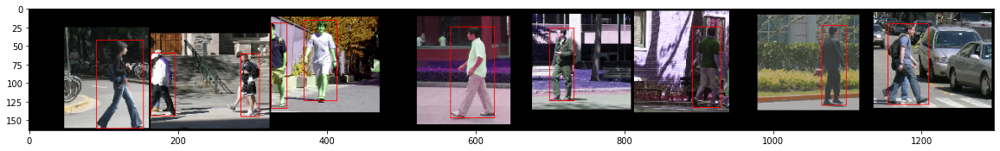

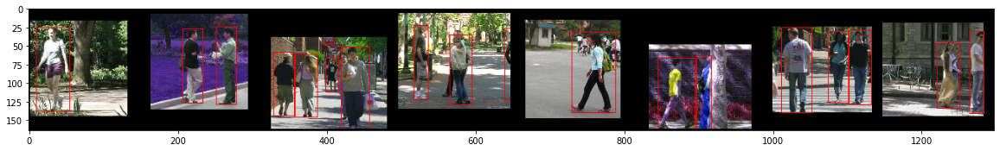

Dataset size: 100
Test:


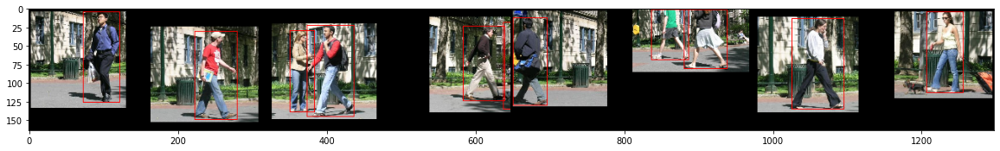

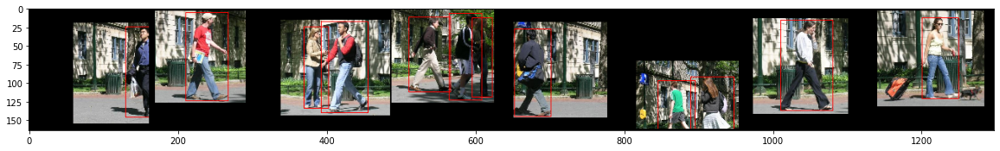

In [12]:
plt.rcParams['figure.figsize'] = [20, 20]

dataloader_train = get_dataloader(DATASET_PATH,
                                  train=True,
                                  batch_size=BATCH_SIZE_TRAIN,
                                  input_size=INPUT_SIZE
                                  )
print("Train:")
show_sample(dataloader_train, num_samples=2)


dataloader_test = get_dataloader(DATASET_PATH,
                                 train=False,
                                 batch_size=BATCH_SIZE_VALID,
                                 input_size=INPUT_SIZE
                                 )
print("Test:")
show_sample(dataloader_test, num_samples=2)


Important note: Our test data is very small. To extend our validation we also augment test dataset. We assume that our test data comes from such distribution. To avoid bad seed/randomization problems we multiply it many times (`MULTIPLY_TEST_N_TIMES` times).

# Implement Neural Network (1 p.)
For bakcbone use EfficientNet B2 pretrained on ImageNet.
* Implement missing methods.


In [13]:
import torch.nn as nn

from torchvision.models import efficientnet_b2


class Head(nn.Module):
    def __init__(self, channels_in, anchor_shape=None, n=2):
        super(Head, self).__init__()
        class_amount = 1

        self.cls = nn.Sequential(
            nn.Conv2d(channels_in, channels_in//n, 3, padding=1),
            nn.SiLU(),
            nn.Conv2d(channels_in//n, class_amount, 3, padding=1)
            )
        
        self.reg = nn.Sequential(
            nn.Conv2d(channels_in, channels_in//n, 3, padding=1),
            nn.SiLU(),
            nn.Conv2d(channels_in//n, 4, 3, padding=1)
            )

    def forward(self, x):
        cls = self.cls(x)
        reg = self.reg(x)

        return cls, reg


class EfficientSSD(nn.Module):
    def __init__(self, anchor_shapes):
        super(EfficientSSD, self).__init__()
        self.anchor_shapes = anchor_shapes

        # we only want feature extractor
        self.backbone = efficientnet_b2(pretrainder=True).features[:-3]
        # manually checked out_featues amount
        backbone_out_features = 120
        # one head for each anchor
        self.heads = [Head(backbone_out_features).to(DEVICE) for _ in range(len(anchor_shapes))]

    def forward(self, x):
        x = self.backbone(x)
        # head output for each anchor
        outputs = [head(x) for head in self.heads]
        return outputs

In [14]:
test_tensor = torch.ones(size=(16, 3, 160, 160))

def test_efficientnet_ssd():
    net = EfficientSSD(anchor_shapes=[(2,2), (3, 3)])
    net = net.to(DEVICE)
    res = net(test_tensor.to(DEVICE)) # simple version: two anchor shapes
    cls0, reg0 = res[0]
    cls1, reg1 = res[1]
    print(reg0.shape)

test_efficientnet_ssd()

torch.Size([16, 4, 10, 10])


# Implement generating proposals. (1 p.)
Note that at this point coordinates of boxes are in [0, 1]. Proposals size on the image should be computed using [formula for receptive field](https://www.baeldung.com/cs/cnn-receptive-field-size) or some approximation.
* Implement missing functions.

In [15]:
from itertools import product

def generate_indexes(shape):
    # shape in (H, W) format
    h, w = shape
    
    cxs, cys = [(x+0.5)/w for x in range(w)], [(y+0.5)/h for y in range(h)]
    
    coords = torch.tensor(list(product(cxs, cys)))

    xs, ys = coords[:, 0], coords[:, 1]

    return xs, ys

def generate_proposals(anchor_shape, output_spatial_shape):
    """
    :param anchor_shape: (H, W)
    :param output_spatial_shape: (H, W)
    :return: tensor [N, 4, H, W], coords format cxcywh all in [0, 1]
    """
    xs, ys = generate_indexes(output_spatial_shape)
    hs, ws = proposal_shape(anchor_shape, output_spatial_shape)

    h, w = output_spatial_shape
    res = torch.stack([xs, ys, ws, hs], dim=0).view(4, h, w)
    
    return res.to(device=DEVICE)

def proposal_shape(anchor_shape, output_spatial_shape):
    h, w = output_spatial_shape
    anchor_h, anchor_w = anchor_shape

    hs, ws = [anchor_h/h for _ in range(h**2)], [anchor_w/w for _ in range(w**2)]

    return torch.tensor(hs), torch.tensor(ws)

Lets define useful function when operating on boxes:

In [16]:
from utils import flatten_boxes_tensor

# Analyse proposals (1 p.)
* Modify previously defined ANCHOR_SIZES balancing training time and coverage of ground truth boxes. Report results.

Najlepszymi kształtami anchorów będą takie kształty, które relatywnie dobrze będą pasować do możliwie dużej liczby ground truth boxów.

Aby znaleźć takie kształty, postanowiłem przeprowadzić klasteryzacje aspect ratio wszystkich ground truth boxów.

Wykorzystałem algorytm Kmeans, który na wejściu wymaga odgórnie ilości klastrów do przewidzenia. Wartość ta będzie zależeć od wariantu sieci, dla które będziemy szukać najlepszych anchor boxów (Simple model: 2 lub model z wieloma dodatkowymi warstwami detektorów: 5).

Po klasteryzacji bierzemy centroidy poszczególnych klastrów, to będą nasi kandydaci na aspect ratio dla anchor_shape.

Następnie ręcznie modyfikuje kandydatów w taki sposób, aby uzyskać możliwie dobry gt box cover.

In [17]:
all_boxes_train = []

for batch_imgs, batch_boxes in iter(dataloader_train):
    for img, box_tensor in zip(batch_imgs, batch_boxes):
        denorm_boxes = denormalize_boxes(box_tensor, img.shape[1], img.shape[2])
        denorm_boxes = box_convert(denorm_boxes, "xyxy", "cxcywh")
        all_boxes_train.append(denorm_boxes[:, [2, 3]])

all_boxes_test = []

for batch_imgs, batch_boxes in iter(dataloader_test):
    for img, box_tensor in zip(batch_imgs, batch_boxes):
        denorm_boxes = denormalize_boxes(box_tensor, img.shape[1], img.shape[2])
        denorm_boxes = box_convert(denorm_boxes, "xyxy", "cxcywh")
        all_boxes_test.append(denorm_boxes[:, [2, 3]])
        
all_boxes_train = torch.cat(all_boxes_train)
all_boxes_test = torch.cat(all_boxes_test)
all_boxes = torch.cat([all_boxes_train, all_boxes_test])

In [18]:
print(all_boxes_train.shape)
print(all_boxes_test.shape)
print(all_boxes.shape)

torch.Size([377, 2])
torch.Size([160, 2])
torch.Size([537, 2])


Wykres przedstawiający kształty wszystkich ground truth boxów.

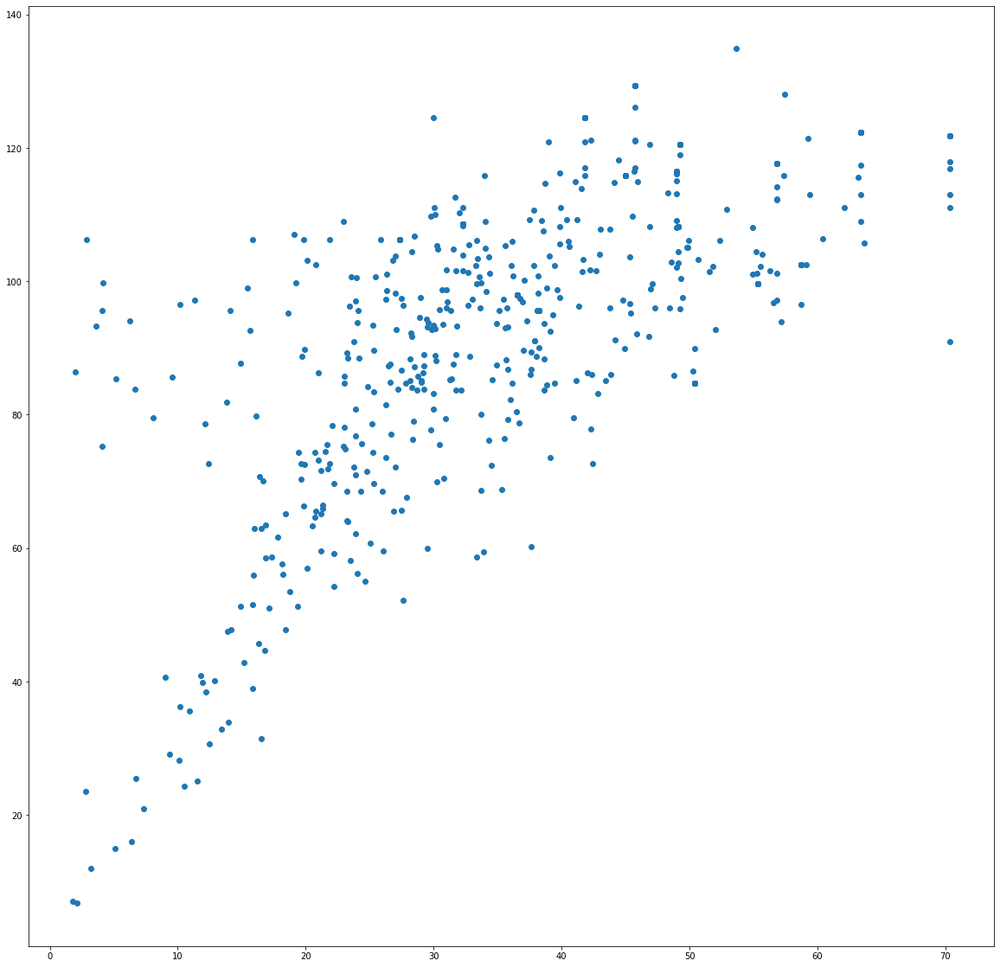

In [19]:
plt.scatter(x=all_boxes[:, 0], y=all_boxes[:, 1])

Liczymy aspect ratio dla wszystkich boxów a następnie je klastrujemy.

In [20]:
from sklearn.cluster import KMeans

all_ratios = torch.tensor([i[0]/i[1] for i in all_boxes]).view(-1, 1)
aspect_ratio_clusters = KMeans(n_clusters=5).fit(all_ratios).cluster_centers_
aspect_ratio_clusters

array([[0.57434894],
       [0.29116461],
       [0.47387428],
       [0.12775329],
       [0.37654909]])

In [21]:
norm_shapes = torch.tensor([(1/np.sqrt(i[0]), np.sqrt(i[0])) for i in aspect_ratio_clusters])
norm_shapes

tensor([[1.3195, 0.7579],
        [1.8532, 0.5396],
        [1.4527, 0.6884],
        [2.7978, 0.3574],
        [1.6296, 0.6136]], dtype=torch.float64)

In [22]:
ANCHOR_SHAPES = norm_shapes*5
ANCHOR_SHAPES

tensor([[ 6.5975,  3.7893],
        [ 9.2662,  2.6980],
        [ 7.2634,  3.4419],
        [13.9889,  1.7871],
        [ 8.1482,  3.0682]], dtype=torch.float64)

Niestety wyniki klasteryzacji nie dają najlepszych wyników. Będę je bardziej traktował poglądowo.

Przeprowadze przeszukiwanie testujące jakiś zakres kształtów i wezme te kształty z najlepszym ground truth box cover. Najlepsze utowrzą ANCHOR_SHAPES.

Oczywiście można by napisać lepszy algorytm do znajdwania optymalnych shapeów, ale niestety kończy mi się czas.

In [23]:
def anchor_generator():
    return list(product(range(1, 15), range(1, 6)))

test_shapes = anchor_generator()

In [24]:
def test_anchors():
    # we assume our neural network makes some downsamples
    num_downsamples = 4

    rescale = 2**num_downsamples

    boxes = []
    for dp in dataloader_train:
        imgs, targets = dp
        for i in range(BATCH_SIZE_TRAIN):
            for gt_boxes in targets[i]:
                boxes.append(gt_boxes)

    boxes = torch.stack(boxes).to(device=DEVICE)

    dp = next(iter(dataloader_train))
    imgs, targets = dp
    img = imgs[0]
    H_out, W_out = img.shape[1] // rescale, img.shape[2] // rescale


    masks = []
    for AS in ANCHOR_SHAPES:
        proposals = generate_proposals(AS, (H_out, W_out))
        proposals = flatten_boxes_tensor(proposals)
        proposals = box_convert(proposals, "cxcywh", "xyxy")

        print(f"Generating proposals: anchor shape {AS}, spatial_shape: {(H_out, W_out)} \n")

        iou_matrix = torchvision.ops.box_iou(boxes, proposals)
        debug(iou_matrix, "iou_matrix")
        iou_max, idxes = iou_matrix.max(dim=1)
        mask = iou_max > IOU_THRESHOLD
        masks.append(mask)

    mask_final = reduce(torch.logical_or, masks)
    print(f"In total, there is {mask_final.sum()}/{len(boxes)} gt boxes covered, that is {mask_final.sum()/len(boxes)*100:.2f} % \n")
    for i, (AS, m) in enumerate(zip(ANCHOR_SHAPES, masks)):
        print(f"Anchor {AS} covers {m.sum()}/{len(boxes)}, gt boxes, that is {m.sum()/len(boxes)*100:.2f} %")
        val = reduce(torch.logical_or, masks[:i] + masks[i+1:]).sum()
        added = mask_final.sum() - val
        print(f"Adding anchor {AS} covers additional: {added}/{len(boxes)} gt boxes, that is {added / len(boxes) * 100:.2f} % \n")
        print()

ANCHOR_SHAPES = test_shapes
test_anchors()

Generating proposals: anchor shape (1, 1), spatial_shape: (10, 10) 

Generating proposals: anchor shape (1, 2), spatial_shape: (10, 10) 

Generating proposals: anchor shape (1, 3), spatial_shape: (10, 10) 

Generating proposals: anchor shape (1, 4), spatial_shape: (10, 10) 

Generating proposals: anchor shape (1, 5), spatial_shape: (10, 10) 

Generating proposals: anchor shape (2, 1), spatial_shape: (10, 10) 

Generating proposals: anchor shape (2, 2), spatial_shape: (10, 10) 

Generating proposals: anchor shape (2, 3), spatial_shape: (10, 10) 

Generating proposals: anchor shape (2, 4), spatial_shape: (10, 10) 

Generating proposals: anchor shape (2, 5), spatial_shape: (10, 10) 

Generating proposals: anchor shape (3, 1), spatial_shape: (10, 10) 

Generating proposals: anchor shape (3, 2), spatial_shape: (10, 10) 

Generating proposals: anchor shape (3, 3), spatial_shape: (10, 10) 

Generating proposals: anchor shape (3, 4), spatial_shape: (10, 10) 

Generating proposals: anchor shape

Najelpszy wynik ~ 91% dają: [(3, 1), (3, 2), (4, 2), (5, 1), (6, 2), (6, 3)]

Je wykorzystamy do trenowania rozszerzonego modelu.

Do trenowania uproszczonego modelu wykorzystamy jego dwuelementowy najlepszy podzbiór.

In [25]:
ANCHOR_SHAPES = [(3, 1), (3, 2), (4, 2), (5, 1), (6, 2), (6, 3)]
test_anchors()

Generating proposals: anchor shape (3, 1), spatial_shape: (10, 10) 

Generating proposals: anchor shape (3, 2), spatial_shape: (10, 10) 

Generating proposals: anchor shape (4, 2), spatial_shape: (10, 10) 

Generating proposals: anchor shape (5, 1), spatial_shape: (10, 10) 

Generating proposals: anchor shape (6, 2), spatial_shape: (10, 10) 

Generating proposals: anchor shape (6, 3), spatial_shape: (10, 10) 

In total, there is 332/372 gt boxes covered, that is 89.25 % 

Anchor (3, 1) covers 28/372, gt boxes, that is 7.53 %
Adding anchor (3, 1) covers additional: 4/372 gt boxes, that is 1.08 % 


Anchor (3, 2) covers 44/372, gt boxes, that is 11.83 %
Adding anchor (3, 2) covers additional: 2/372 gt boxes, that is 0.54 % 


Anchor (4, 2) covers 181/372, gt boxes, that is 48.66 %
Adding anchor (4, 2) covers additional: 7/372 gt boxes, that is 1.88 % 


Anchor (5, 1) covers 82/372, gt boxes, that is 22.04 %
Adding anchor (5, 1) covers additional: 6/372 gt boxes, that is 1.61 % 


Anchor 

In [26]:
from itertools import combinations

subset_ANCHOR_SHAPES = list(combinations(ANCHOR_SHAPES, 2))

for shapes in subset_ANCHOR_SHAPES:
    ANCHOR_SHAPES = shapes
    test_anchors()

Generating proposals: anchor shape (3, 1), spatial_shape: (10, 10) 

Generating proposals: anchor shape (3, 2), spatial_shape: (10, 10) 

In total, there is 79/368 gt boxes covered, that is 21.47 % 

Anchor (3, 1) covers 30/368, gt boxes, that is 8.15 %
Adding anchor (3, 1) covers additional: 21/368 gt boxes, that is 5.71 % 


Anchor (3, 2) covers 58/368, gt boxes, that is 15.76 %
Adding anchor (3, 2) covers additional: 49/368 gt boxes, that is 13.32 % 


Generating proposals: anchor shape (3, 1), spatial_shape: (10, 10) 

Generating proposals: anchor shape (4, 2), spatial_shape: (10, 10) 

In total, there is 208/375 gt boxes covered, that is 55.47 % 

Anchor (3, 1) covers 36/375, gt boxes, that is 9.60 %
Adding anchor (3, 1) covers additional: 24/375 gt boxes, that is 6.40 % 


Anchor (4, 2) covers 184/375, gt boxes, that is 49.07 %
Adding anchor (4, 2) covers additional: 172/375 gt boxes, that is 45.87 % 


Generating proposals: anchor shape (3, 1), spatial_shape: (10, 10) 

Generati

Dla dwóch shapeów najlepszy wynik ~ 81% daje [(6, 2), (5, 1)]

In [27]:
ANCHOR_SHAPES = [(6, 2), (5, 1)]
test_anchors()

Generating proposals: anchor shape (6, 2), spatial_shape: (10, 10) 

Generating proposals: anchor shape (5, 1), spatial_shape: (10, 10) 

In total, there is 300/369 gt boxes covered, that is 81.30 % 

Anchor (6, 2) covers 270/369, gt boxes, that is 73.17 %
Adding anchor (6, 2) covers additional: 213/369 gt boxes, that is 57.72 % 


Anchor (5, 1) covers 87/369, gt boxes, that is 23.58 %
Adding anchor (5, 1) covers additional: 30/369 gt boxes, that is 8.13 % 




Zwiększam trochę boxy aby uzyskać lepsze wyniki (testowane w Test compute_loss)

In [28]:
ANCHOR_SHAPES = torch.tensor([(6, 2), (5, 1)]) * 1.25
ANCHOR_SHAPES

tensor([[7.5000, 2.5000],
        [6.2500, 1.2500]])

This is copied from pytroch implementation! Before we implement loss function we define encoding and decoding functions. This encoding simplifies targets of the network to realtive offsets from corresponding proposals. In our case `encode_boxes` will be called for gt_boxes and corresponding proposals and `decode_single` will be called for output of regression and corresponding proposals. `decode_single` is modified to take `weights` as param.


In [29]:
from encode import encode_boxes, decode_single

# Implement loss function (1 p.)
This a simple (haha), iterative version of loss function. Iterates over batch and over gt_box on the image and is supposed to compute smooth l1 between gt boxes and predicted encoded boxes coordinates and cross entropy between class predictions and targets.
* Add loss functions and implement some form of balancing/sampling between positive examples and negative examples (sampling, hard negative mining, weighting loss etc.)

In [30]:
def get_negatives_with_highest_iou(iou_scores, positive_amount, threshold, n=3):
    """
    Ta metoda z jakiegoś dziwnego powodu drastycznie pogarsza uzyskane wyniki.
    Interesujące.
    """
    sorted_iou_scores, indecies = iou_scores.sort(descending=True)
    
    # we want positive to negative ratio to be equal to 1:3
    indecies = indecies[positive_amount:positive_amount*n+positive_amount]

    mask = [0 for _ in range(len(iou_scores))]
    for index in indecies:
        mask[index] = 1

    mask = torch.tensor(mask).to(bool)
    return mask.to(DEVICE)

def get_negatives_with_lowest_iou(iou_scores, positive_amount, threshold, n=3):
    sorted_iou_scores, indecies = iou_scores.sort(descending=False)
    
    # we want positive to negative ratio to be equal to 1:3
    indecies = indecies[0:positive_amount*n:]
    mask = [0 for _ in range(len(iou_scores))]
    for index in indecies:
        mask[index] = 1

    mask = torch.tensor(mask).to(bool)
    return mask.to(DEVICE)

def get_random_negatives(iou_scores, positive_amount, threshold, n=3):
    sorted_iou_scores, indecies = iou_scores.sort(descending=True)

    indecies = indecies[positive_amount:]
    indecies = torch.index_select(indecies, 0, torch.randperm(len(indecies)).to(DEVICE)[:n*positive_amount])

    mask = [0 for _ in range(len(iou_scores))]

    for index in indecies:
        mask[index] = 1

    mask = torch.tensor(mask).to(bool)
    return mask.to(DEVICE)

# """Test"""
# test_tensor = torch.tensor([0.6, 0.6, 0.6, 0.1, 0.1, 0.1, 0.0, 0.0, 0.0]).to(DEVICE)

# print(get_negatives_with_lowest_iou(test_tensor, 3, 0.5, 1))

In [31]:
from torch.nn.functional import smooth_l1_loss, binary_cross_entropy_with_logits


def compute_loss(outputs, gt_boxes, anchor_shape, reg_weights, scale=None):
    """
    :param outputs: Tuple: (cls logits tensor [N, 1, H, W] - only single class, regression output as encoded boxes tensor [N, 4, H, W]), where N is batch_size
    :param gt_boxes: format [N, 4], xyxy, xy in [0,1] x [0,1]
    :param anchor_shape: (H, W)
    :return: classification and regression losses
    """

    output_cls, output_reg = outputs
    
    loss_reg_init = torch.tensor(0.0, requires_grad = True).to(device=DEVICE)
    loss_cls_init = torch.tensor(0.0, requires_grad = True).to(device=DEVICE)

    loss_reg = [loss_reg_init]
    loss_cls = [loss_cls_init]

    H_out, W_out = output_reg.shape[2], output_reg.shape[3]
    # iteratively for each image in a batch
    for i in range(len(output_reg)): # assert len(output) == batch_size
        gt_boxes_per_img = gt_boxes[i]
        gt_boxes_per_img = gt_boxes_per_img.to(DEVICE)
        out_reg_per_img = output_reg[i]
        out_reg_per_img = flatten_boxes_tensor(out_reg_per_img)
        
        out_cls_per_img = output_cls[i]
        out_cls_per_img = torch.reshape(out_cls_per_img, [1, H_out*W_out]).permute([1, 0])

        # for multi scale variant*
        if scale is not None:
            anchor_shape = (anchor_shape[0] * scale, anchor_shape[1] * scale)

        proposals = generate_proposals(anchor_shape, (H_out, W_out))
        proposals = flatten_boxes_tensor(proposals)
        proposals = box_convert(proposals, "cxcywh", "xyxy")
        
        iou_matrix = torchvision.ops.box_iou(gt_boxes_per_img, proposals)
        if iou_matrix.numel() != 0:
            debug(iou_matrix, "iou_matrix")

        if iou_matrix.shape[0] > 0:

            # iteratively for each image in a batch # You can improve it, but not necessarily.
            # for each ground truth box, we take default box with high enaught iou*
            for j in range(len(gt_boxes_per_img)):
                gt_box = gt_boxes_per_img[j]

                matched_to_box = iou_matrix[j] > IOU_THRESHOLD

                matched_proposals = proposals[matched_to_box, :]

                encoded = encode_boxes(gt_box.expand(matched_proposals.shape), matched_proposals, weights=reg_weights)

                out_reg = out_reg_per_img[matched_to_box]

                if out_reg.shape[0] != 0:
                    loss_reg.append(smooth_l1_loss(out_reg, encoded).to(DEVICE))

            # default boxes that match best some ground truth boxes*
            iou_max, idxes = iou_matrix.max(dim=0)

            matched_to_any = iou_max > IOU_THRESHOLD
            
            positive_amount = torch.count_nonzero(matched_to_any)

            hard_negative = get_negatives_with_lowest_iou(iou_max, positive_amount, IOU_THRESHOLD, n=3) # TODO you can use some version of sampling

            mask_cls = torch.logical_or(matched_to_any, hard_negative)
            
            if matched_to_any.count_nonzero():

                out_cls_ = torch.squeeze(out_cls_per_img).float()[mask_cls]
                targets_cls_ = matched_to_any.float()[mask_cls]

                POS_WEIGHT = torch.tensor([3]).to(DEVICE) # TODO You can use weighting
                loss_cls_ = binary_cross_entropy_with_logits(out_cls_, targets_cls_, pos_weight=POS_WEIGHT).to(DEVICE)
                loss_cls.append(loss_cls_)

    loss_cls = torch.stack(loss_cls).sum()
    loss_reg = torch.stack(loss_reg).sum()

    return loss_cls, loss_reg

def compute_loss_test(outputs, gt_boxes, anchor_shape, reg_weights, scale=None):
    """
    :param outputs: Tuple: (cls logits tensor [N, 1, H, W] - only single class, regression output as encoded boxes tensor [N, 4, H, W]), where N is batch_size
    :param gt_boxes: format [N, 4], xyxy, xy in [0,1] x [0,1]
    :param anchor_shape: (H, W)
    :return: classification and regression losses
    """

    output_cls, output_reg = outputs
    
    loss_reg_init = torch.tensor(0.0, requires_grad = True).to(device=DEVICE)
    loss_cls_init = torch.tensor(0.0, requires_grad = True).to(device=DEVICE)

    loss_reg = [loss_reg_init]
    loss_cls = [loss_cls_init]

    H_out, W_out = output_reg.shape[2], output_reg.shape[3]
    """TEST"""
    c = 0
    # iteratively for each image in a batch
    for i in range(len(output_reg)): # assert len(output) == batch_size
        gt_boxes_per_img = gt_boxes[i]
        gt_boxes_per_img = gt_boxes_per_img.to(DEVICE)
        out_reg_per_img = output_reg[i]
        out_reg_per_img = flatten_boxes_tensor(out_reg_per_img)
        
        out_cls_per_img = output_cls[i]
        out_cls_per_img = torch.reshape(out_cls_per_img, [1, H_out*W_out]).permute([1, 0])

        # for multi scale variant*
        if scale is not None:
            anchor_shape = (anchor_shape[0] * scale, anchor_shape[1] * scale)

        proposals = generate_proposals(anchor_shape, (H_out, W_out))
        proposals = flatten_boxes_tensor(proposals)
        proposals = box_convert(proposals, "cxcywh", "xyxy")
        
        iou_matrix = torchvision.ops.box_iou(gt_boxes_per_img, proposals)
        if iou_matrix.numel() != 0:
            debug(iou_matrix, "iou_matrix")

        if iou_matrix.shape[0] > 0:

            # iteratively for each image in a batch # You can improve it, but not necessarily.
            # for each ground truth box, we take default box with high enaught iou*
            for j in range(len(gt_boxes_per_img)):
                gt_box = gt_boxes_per_img[j]

                matched_to_box = iou_matrix[j] > IOU_THRESHOLD

                matched_proposals = proposals[matched_to_box, :]

                encoded = encode_boxes(gt_box.expand(matched_proposals.shape), matched_proposals, weights=reg_weights)

                out_reg = out_reg_per_img[matched_to_box]

                if out_reg.shape[0] != 0:
                    loss_reg.append(smooth_l1_loss(out_reg, encoded).to(DEVICE))

            # default boxes that match best some ground truth boxes*
            iou_max, idxes = iou_matrix.max(dim=0)

            matched_to_any = iou_max > IOU_THRESHOLD
            
            positive_amount = torch.count_nonzero(matched_to_any)

            """TEST"""
            c += positive_amount.item()

            hard_negative = get_negatives_with_lowest_iou(iou_max, positive_amount, IOU_THRESHOLD, n=3) # TODO you can use some version of sampling

            mask_cls = torch.logical_or(matched_to_any, hard_negative)
            
            if matched_to_any.count_nonzero():

                out_cls_ = torch.squeeze(out_cls_per_img).float()[mask_cls]
                targets_cls_ = matched_to_any.float()[mask_cls]

                POS_WEIGHT = torch.tensor([3]).to(DEVICE) # TODO You can use weighting
                loss_cls_ = binary_cross_entropy_with_logits(out_cls_, targets_cls_, pos_weight=POS_WEIGHT).to(DEVICE)
                loss_cls.append(loss_cls_)

    loss_cls = torch.stack(loss_cls).sum()
    loss_reg = torch.stack(loss_reg).sum()

    """TEST"""
    return loss_cls, loss_reg, c/16
    # return loss_cls, loss_reg

Test compute_loss

In [32]:
dataiter_train = iter(dataloader_train)
batch = next(dataiter_train)
imgs, gt_boxes = batch

net = EfficientSSD(anchor_shapes=ANCHOR_SHAPES)
net = net.to(DEVICE)

imgs = torch.stack(imgs, dim=0).to(DEVICE)

outputs = net(imgs)

loss_cls, loss_reg = compute_loss(outputs[1], gt_boxes, ANCHOR_SHAPES[1], torch.from_numpy(np.array([1, 1, 1, 1])).to(DEVICE))
print(loss_cls, loss_reg)

tensor(14.0498, device='cuda:0', grad_fn=<SumBackward0>) tensor(2.4700, device='cuda:0', grad_fn=<SumBackward0>)


In [33]:
"""TEST"""
ANCHOR_SHAPES = torch.tensor([(6, 2), (5, 1)]) * 1.25
sss = 0

for _ in range(5):
    dataiter_train = iter(dataloader_train)
    ss = 0
    for _ in range(10):
        batch = next(dataiter_train)
        imgs, gt_boxes = batch
        imgs = torch.stack(imgs, dim=0).to(DEVICE)

        outputs = net(imgs)
        loss_cls, loss_reg, c = compute_loss_test(outputs[1], gt_boxes, ANCHOR_SHAPES[1], torch.from_numpy(np.array([1, 1, 1, 1])).to(DEVICE))
        ss += c
        loss_cls, loss_reg, c = compute_loss_test(outputs[0], gt_boxes, ANCHOR_SHAPES[0], torch.from_numpy(np.array([1, 1, 1, 1])).to(DEVICE))
        ss += c

    sss += ss/10
print(sss/5)

6.465000000000001


# Lightning model definition - implement predict_step (1 p.)
As metric we use Mean Average Precission, see [mAP](https://towardsdatascience.com/map-mean-average-precision-might-confuse-you-5956f1bfa9e2) and [mAP](https://jonathan-hui.medium.com/map-mean-average-precision-for-object-detection-45c121a31173). In postprocess we remove small boxes and we remove overlapping boxes with lower scores (non maximum suppression).

In [34]:
PRED_IMGS_TO_SEND = 5

In [35]:
import pytorch_lightning as pt
from torch.optim.lr_scheduler import ExponentialLR
from torchmetrics.detection import MeanAveragePrecision


class SimpleModel(pt.LightningModule):
    def __init__(self, net):
        super().__init__()
        self._net = net
        self._map = MeanAveragePrecision().cpu()
        self._reg_weights = torch.from_numpy(np.array([1, 1, 1, 1])).to(device=DEVICE)

    def forward(self, x):
        return self._net(x)

    def on_epoch_start(self):
        self.log("lr", self.lr_schedulers().get_last_lr()[0])

    def on_epoch_end(self):
        self.lr_schedulers().step()

    def training_step(self, batch, batch_idx):
        imgs, gt_boxes = batch

        imgs = torch.stack(imgs, dim=0)

        outputs = self(imgs) # list of head_outputs with element amount equal to amount of anchor shapes

        loss_cls, loss_reg = compute_loss(outputs[0], gt_boxes, self._net.anchor_shapes[0], self._reg_weights)
        loss_cls2, loss_reg2 = compute_loss(outputs[1], gt_boxes, self._net.anchor_shapes[1], self._reg_weights)

        loss_cls += loss_cls2
        loss_reg += loss_reg2

        l_reg = COEFF_REG * loss_reg
        l_cls = COEFF_CLS * loss_cls
        loss = l_cls + l_reg
        self.log("reg_loss", l_reg)
        self.log("cls_loss", l_cls)

        return loss

    def configure_optimizers(self):
        # optimizer = torch.optim.Adam(self.parameters(), lr=LEARNING_RATE)
        optimizer = torch.optim.RMSprop(self.parameters(), lr=LEARNING_RATE)
        return [optimizer], [ExponentialLR(optimizer, gamma=LR_DECAY)]

    
    def on_validation_epoch_start(self):
      self._map.cpu()
      self._map.reset()


    def validation_step(self, batch, batch_idx):
        imgs, targets = batch

        imgs = torch.stack(imgs, dim=0)

        outputs = self(imgs)

        self._map.cpu()

        res_imgs = []
        for i in range(len(imgs)):
            im = imgs[i]

            out_cls1 = outputs[0][0][i]
            out_reg1 = outputs[0][1][i]
            out_cls2 = outputs[1][0][i]
            out_reg2 = outputs[1][1][i]

            gt_boxes = targets[i]

            im = denormalize(im).byte()

            proposals1 = generate_proposals(self._net.anchor_shapes[0], (out_cls1.shape[1], out_cls1.shape[2]))
            proposals2 = generate_proposals(self._net.anchor_shapes[1], (out_cls2.shape[1], out_cls2.shape[2]))

            scores1, boxes1 = self.postprocess(out_cls1, out_reg1, cls_threshold=CLS_THRESHOLD, proposals=proposals1)
            scores2, boxes2 = self.postprocess(out_cls2, out_reg2, cls_threshold=CLS_THRESHOLD, proposals=proposals2)

            scores, boxes = torch.cat((scores1, scores2)), torch.cat((boxes1, boxes2))

            idxes = torchvision.ops.nms(boxes, scores, iou_threshold=NMS_THRESHOLD)
            boxes = boxes[idxes]
            scores = scores[idxes]

            H, W = im.shape[1], im.shape[2]

            if boxes.shape[0] > 0:
                boxes = denormalize_boxes(boxes, H, W)
            gt_bb = denormalize_boxes(gt_boxes, H, W)

            if batch_idx < VAL_IMGS_TO_SEND:
              im = draw_bounding_boxes(im.cpu(), gt_bb.cpu(), colors=(255, 0, 0))
              im = draw_bounding_boxes(im, boxes.cpu(), colors=(0, 255, 0))
              res_imgs.append(im)

            labels = torch.ones(scores.shape, dtype=torch.int32)
            labels2 = torch.ones(gt_boxes.shape[0], dtype=torch.int32)

            preds = [{"boxes": boxes.cpu(), "scores": scores.cpu(), "labels": labels.cpu()}]
            target = [{"boxes": gt_bb.cpu(), "labels": labels2.cpu()}]
            self._map.update(preds, target)
        
        if batch_idx < VAL_IMGS_TO_SEND:

          res_imgs = torch.stack(res_imgs, dim=0)

          res_grid = torchvision.utils.make_grid(res_imgs)
          self.logger.experiment.add_image(f'outputs{batch_idx}', res_grid, global_step=self.global_step)

        self.log('val_map', self._map.compute()['map'])

    
    def on_validatoin_epoch_end(self):
      self.log('val_map', self._map.compute()['map'])


    def predict_step(self, batch, batch_idx):
        imgs, targets = batch

        if targets is not None:
            self._map.cpu()
            self._map.reset()

        imgs = torch.stack(imgs, dim=0)

        outputs = self(imgs)

        output = []
        res_imgs = []

        for i in range(len(imgs)):
            im = imgs[i]
            im = denormalize(im).byte()

            h, w = im.shape[1], im.shape[2]

            out_cls1 = outputs[0][0][i]
            out_reg1 = outputs[0][1][i]
            out_cls2 = outputs[1][0][i]
            out_reg2 = outputs[1][1][i]

            if targets is not None:
                gt_boxes = targets[i]
                gt_bb = denormalize_boxes(gt_boxes, h, w)
                labels2 = torch.ones(gt_boxes.shape[0], dtype=torch.int32)

            proposals1 = generate_proposals(self._net.anchor_shapes[0], (out_cls1.shape[1], out_cls1.shape[2]))
            proposals2 = generate_proposals(self._net.anchor_shapes[1], (out_cls2.shape[1], out_cls2.shape[2]))

            scores1, boxes1 = self.postprocess(out_cls1, out_reg1, cls_threshold=CLS_THRESHOLD, proposals=proposals1)
            scores2, boxes2 = self.postprocess(out_cls2, out_reg2, cls_threshold=CLS_THRESHOLD, proposals=proposals2)

            scores, boxes = torch.cat((scores1, scores2)), torch.cat((boxes1, boxes2))
            idxes = torchvision.ops.nms(boxes, scores, iou_threshold=NMS_THRESHOLD)

            scores, boxes = scores[idxes], boxes[idxes]

            if boxes.shape[0] > 0:
                boxes = denormalize_boxes(boxes, h, w)

            if batch_idx < PRED_IMGS_TO_SEND:
                im = draw_bounding_boxes(im.cpu(), gt_bb.cpu(), colors=(255, 0, 0))
                im = draw_bounding_boxes(im, boxes.cpu(), colors=(0, 255, 0))
                res_imgs.append(im)

            labels = torch.ones(scores.shape, dtype=torch.int32)
            
            output.append([labels, boxes])

            preds = [{"boxes": boxes.cpu(), "scores": scores.cpu(), "labels": labels.cpu()}]
            target = [{"boxes": gt_bb.cpu(), "labels": labels2.cpu()}]
            self._map.update(preds, target)
        
        if batch_idx < PRED_IMGS_TO_SEND:

            res_imgs = torch.stack(res_imgs, dim=0)

            res_grid = torchvision.utils.make_grid(res_imgs)
            self.logger.experiment.add_image(f'pred_outputs{batch_idx}', res_grid, global_step=self.global_step)

        print(self._map.compute()['map'])

        return output

    def postprocess(self, out_cls, out_reg, cls_threshold, proposals):
        """
        out_reg -> "cxcywh"
        """
        scores = torch.sigmoid(out_cls)
        mask = scores >= cls_threshold

        proposals_boxes_ = proposals.expand(out_reg.shape)

        proposals_boxes_ = proposals_boxes_[:, mask.squeeze()]

        proposals_boxes_ = flatten_boxes_tensor(proposals_boxes_)

        out_reg = out_reg[mask.expand(out_reg.shape)]
        out_reg = flatten_boxes_tensor(out_reg)

        out_reg = decode_single(out_reg, proposals_boxes_, weights=self._reg_weights)

        scores = scores[mask]

        out_reg = torchvision.ops.clip_boxes_to_image(out_reg, (1, 1))
        idxes = torchvision.ops.remove_small_boxes(out_reg, min_size=1 / 100)

        out_reg = out_reg[idxes]
        scores = scores[idxes]

        return scores, out_reg


# Training and validation (2 p.)
You should achive > 55 mAP. After 2k steps results should start looking reasonable. On gpu it should run ~1Epoch/10s, so after ~15 minutes you should see some reasonable detections.
* Modify training paramters, optimizer, etc. and use other ML techniques of your choice (regularization, test time augmentation etc.).

In [36]:
%load_ext tensorboard

In [53]:
%tensorboard --logdir tb_logs

Reusing TensorBoard on port 6006 (pid 686), started 1:58:33 ago. (Use '!kill 686' to kill it.)

<IPython.core.display.Javascript object>

Niestety najlepszy wynik mAP jest na poziomie ok 30, więc trochę brakuje mu do 55, ale niestety nie wiem co jest tutaj problemem. Mam problem z wyciśnięciem większej liczby, choć 30 to i tak dużo więcej niż uzyskiwałem początkowo. 

Kształty boxów wydają się optymalne (po testach uzyskuje relatywnie dużo positiveów)

Kompromis między zbyt wczesnym odcięciem w sieci a za małą liczbą default boxów wydaje się dość dobry (bo mam 10x10 i ucinam tylko 3 warstwy).

Podjąłem się prób zmiany optimizera (na Adam i zwykły SGD), ale wszystkie próby pogarszały wynik. Próbowałem dodać regularyzacje weight_decay l2 w optimizerze, ale to drastycznie pogarszało wyniki, próbowałem też dodać momentum, ale to praktycznie nic nie zmieniało.

Testowałem różne metody balansu pos:neg i zastosowałem najlepszy sposób z tych, które sprawdzałem. 

LR i ilość batchy po testach różnych wartości wydaje się dobrze dobrana.

COEFF_CLS, COEFF_REG podstawowe są dobre, cls i reg loss są tych samych rzędów, więc nie trzeba chyba nic zmieniać.

In [38]:
print(ANCHOR_SHAPES)

tensor([[7.5000, 2.5000],
        [6.2500, 1.2500]])


In [39]:
from pytorch_lightning.loggers import TensorBoardLogger


logger = TensorBoardLogger("tb_logs", name="my_model")

net = EfficientSSD(anchor_shapes=ANCHOR_SHAPES)
model = SimpleModel(net)

trainer = pt.Trainer(max_epochs=EPOCHS,
                     detect_anomaly=DETECT_ANOMALY,
                     logger=logger,
                     check_val_every_n_epoch=EPOCHS//20,
                     accelerator=ACCELEREATOR,
                     fast_dev_run=FAST_DEV_RUN,
                     profiler='simple',
                     )

trainer.fit(model, dataloader_train, dataloader_test)
trainer.save_checkpoint("simple_ssd.ckpt")

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/configuration_validator.py:308: LightningDeprecationWarning: The `LightningModule.on_epoch_start` hook was deprecated in v1.6 and will be removed in v1.8. Please use `LightningModule.on_<train/validation/test>_epoch_start` instead.
  f"The `LightningModule.{hook}` hook was deprecated in v1.6 and"
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/configuration_validator.py:308: LightningDeprecationWarning: The `LightningModule.on_epoch_end` hook was deprecated in v1.6 and will be removed in v1.8. Please use `LightningModule.on_<train/validation/test>_epoch_end` instead.
  f"The `LightningModule.{hook}` hook was deprecated in v1.6 and"
Missing logger folder: tb_logs/my_model
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name | Type                 | Params
---------

Sanity Checking: 0it [00:00, ?it/s]

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/data.py:73: UserWarning: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 3. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.
  "Trying to infer the `batch_size` from an ambiguous collection. The batch size we"
/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:136: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  "https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate", UserWarning)
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1931: PossibleUserWarning: Th

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

FIT Profiler Report

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
|  Action                                                                                                                                                                                                    	|  Mean duration (s)	|  Num calls      	|  Total time (s) 	|  Percentage %   	|
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
|  Total                                                                       

In [40]:
trainer.save_checkpoint("simple_ssd.ckpt")

In [41]:
# !ls tb_logs

In [42]:
# !rm -r tb_logs

In [43]:
checkpoint = torch.load("simple_ssd.ckpt")

model.load_state_dict(checkpoint["state_dict"])

p = trainer.predict(model=model, dataloaders=[dataloader_test])

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/configuration_validator.py:308: LightningDeprecationWarning: The `LightningModule.on_epoch_start` hook was deprecated in v1.6 and will be removed in v1.8. Please use `LightningModule.on_<train/validation/test>_epoch_start` instead.
  f"The `LightningModule.{hook}` hook was deprecated in v1.6 and"
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/configuration_validator.py:308: LightningDeprecationWarning: The `LightningModule.on_epoch_end` hook was deprecated in v1.6 and will be removed in v1.8. Please use `LightningModule.on_<train/validation/test>_epoch_end` instead.
  f"The `LightningModule.{hook}` hook was deprecated in v1.6 and"
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 10it [00:00, ?it/s]

tensor(0.1940)
tensor(0.3185)
tensor(0.3694)
tensor(0.4291)
tensor(0.2912)
tensor(0.2786)
tensor(0.2749)
tensor(0.3763)
tensor(0.4472)
tensor(0.2766)
tensor(0.2398)
tensor(0.3156)
tensor(0.2758)


PREDICT Profiler Report

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
|  Action                                                                                                                                                                                                     	|  Mean duration (s)	|  Num calls      	|  Total time (s) 	|  Percentage %   	|
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
|  Total                                                                  

# Extend implementation to multiple ANCHORS (1 p.) and multiple output scales (1 p.)
It's ok if it's not completely general, but it has to be at more scales and/or using more anchors.

In [44]:
def get_scales(layers_amount, s_min=0.2, s_max=0.9):
    def scale_for_layer(k):
        return s_min + ((s_max-s_min)/(layers_amount-1)) * (k-1)
    scale = [scale_for_layer(k) for k in range(1, layers_amount)]
    scale.append(s_max)
    return scale

In [45]:
get_scales(2)

[0.2, 0.9]

In [46]:
ANCHOR_SHAPES = [(3, 1), (3, 2), (4, 2), (5, 1), (6, 2), (6, 3)]
LAYER_AMOUNT = 3
ANCHORS_PER_LAYER = [6 for _ in range(LAYER_AMOUNT)]
SCALES = [0.6*1.25, 1.25, 1.3*1.25]

# ANCHORS_PER_LAYER = [6, 3, 6] # możemy używać róznej ilości anchorów na layer

In [47]:
class ConvModule(nn.Module):
    def __init__(self, in_channels, num_features):
        super().__init__()
        self.layers = nn.Sequential(
            nn.Conv2d(in_channels, num_features, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features),
            nn.ReLU()
        )

    def forward(self, x):
        return self.layers(x)


class EfficientMultiSSD(nn.Module):
    def __init__(self, anchor_shapes, anchors_per_layer, additional_layers=3):
        super(EfficientMultiSSD, self).__init__()
        self.anchor_shapes = anchor_shapes
        self.scales = get_scales(additional_layers)

        # we only want feature extractor
        self.backbone = efficientnet_b2(pretrainder=True).features[:-4] # I want output resolution to be greater than 3x3 (now it's 10x10)
        # manually checked out_featues amount
        backbone_out_features = 88
        in_channels = backbone_out_features
        
        self.additional = []
        self.heads = []

        for i in range(additional_layers):
            out_channels = in_channels * 2

            conv = ConvModule(in_channels, out_channels)
            self.additional.append(conv)
            # one head for each anchor
            self.heads.append(nn.ModuleList([Head(out_channels) for _ in range(anchors_per_layer[i])]))

            in_channels = out_channels

        self.additional = nn.ModuleList(self.additional)
        self.heads = nn.ModuleList(self.heads)

    def forward(self, x):
        x = self.backbone(x)
        outputs = []
        # head output for each anchor
        for idx, addi_layer in enumerate(self.additional):
            x = addi_layer(x)
            outputs.append([head(x) for head in self.heads[idx]])
        return outputs


class EfficientBetterMultiSSD(nn.Module):
    def __init__(self, anchor_shapes, anchors_per_layer, scales):
        super(EfficientBetterMultiSSD, self).__init__()
        self.anchor_shapes = anchor_shapes
        self.scales = scales

        # we only want feature extractor
        self.backbone1 = efficientnet_b2(pretrainder=True).features[:-5] # 20x20
        self.backbone2 = efficientnet_b2(pretrainder=True).features[-5:-3] # 10x10
        self.backbone3 = efficientnet_b2(pretrainder=True).features[-3:] # 5x5
        # manually checked out_featues amount
        backbone_out_features = [48, 120, 1408]
        
        self.heads = []

        for i in range(3):
            out_channels = backbone_out_features[i]
            if i == 2:
                self.heads.append(nn.ModuleList([Head(out_channels, n=10) for _ in range(anchors_per_layer[i])]))
            else:
                self.heads.append(nn.ModuleList([Head(out_channels) for _ in range(anchors_per_layer[i])]))

        self.heads = nn.ModuleList(self.heads)

    def forward(self, x):
        x1 = self.backbone1(x)
        x2 = self.backbone2(x1)
        x3 = self.backbone3(x2)

        outputs = []
        
        # head output for each anchor
        for idx, backbone_out in enumerate([x1, x2, x3]):
            outputs.append([head(backbone_out) for head in self.heads[idx]])
        return outputs

In [48]:
dataiter_train = iter(dataloader_train)
batch = next(dataiter_train)
imgs, gt_boxes = batch

net = EfficientBetterMultiSSD(ANCHOR_SHAPES, ANCHORS_PER_LAYER, SCALES)
net = net.to(DEVICE)

imgs = torch.stack(imgs, dim=0).to(DEVICE)

outputs = net(imgs)

In [49]:
print("layers:", len(outputs))
print("default box type per layer:", [len(i) for i in outputs])
print("cls and reg:", len(outputs[0][0]))

layers: 3
default box type per layer: [6, 6, 6]
cls and reg: 2


In [50]:
"""TEST"""
SCALES = [0.6*1.25, 1.25, 1.3*1.25]

sss = 0

for _ in range(5):
    dataiter_train = iter(dataloader_train)
    ss = 0
    for _ in range(10):
        batch = next(dataiter_train)
        imgs, gt_boxes = batch
        imgs = torch.stack(imgs, dim=0).to(DEVICE)

        outputs = net(imgs)
        for l in range(3):
            for f in range(6):
                loss_cls, loss_reg, c = compute_loss_test(outputs[l][f], gt_boxes, ANCHOR_SHAPES[f], torch.from_numpy(np.array([1, 1, 1, 1])).to(DEVICE), SCALES[l])
                ss += c
    sss += ss/10

print(sss/5)

3.6675000000000004


In [51]:
class MultiModel(pt.LightningModule):
    def __init__(self, net):
        super().__init__()
        self._net = net
        self._map = MeanAveragePrecision().cpu()
        self._reg_weights = torch.from_numpy(np.array([1, 1, 1, 1])).to(device=DEVICE)

    def forward(self, x):
        return self._net(x)

    def on_epoch_start(self):
        self.log("lr", self.lr_schedulers().get_last_lr()[0])

    def on_epoch_end(self):
        self.lr_schedulers().step()

    def training_step(self, batch, batch_idx):
        imgs, gt_boxes = batch

        imgs = torch.stack(imgs, dim=0)

        outputs = self(imgs)

        loss_cls_init = torch.tensor(0.0, requires_grad = True).to(device=DEVICE)
        loss_reg_init = torch.tensor(0.0, requires_grad = True).to(device=DEVICE)

        loss_cls = [loss_cls_init]
        loss_reg = [loss_reg_init]

        for i, detection_layer in enumerate(outputs): # for each additional detection layer
            for j, default_box_head_output in enumerate(detection_layer): # for each default box type from detection_layer one cls and reg detection head
                curr_loss_cls, curr_loss_reg = compute_loss(default_box_head_output, gt_boxes, self._net.anchor_shapes[j], self._reg_weights, self._net.scales[i])
                loss_cls.append(curr_loss_cls)
                loss_reg.append(curr_loss_reg)
        
        loss_cls = torch.stack(loss_cls).sum()
        loss_reg = torch.stack(loss_reg).sum()

        l_reg = COEFF_REG * loss_reg
        l_cls = COEFF_CLS * loss_cls
        loss = l_cls + l_reg
        self.log("reg_loss", l_reg)
        self.log("cls_loss", l_cls)

        return loss

    def configure_optimizers(self):
        optimizer = torch.optim.RMSprop(self.parameters(), lr=LEARNING_RATE)
        return [optimizer], [ExponentialLR(optimizer, gamma=LR_DECAY)]

    
    def on_validation_epoch_start(self):
      self._map.cpu()
      self._map.reset()


    def validation_step(self, batch, batch_idx):
        imgs, targets = batch
        imgs = torch.stack(imgs, dim=0)

        outputs = self(imgs)
        self._map.cpu()

        res_imgs = []
        for i in range(len(imgs)):
            gt_boxes = targets[i]
            im = imgs[i]
            im = denormalize(im).byte()

            unmerged_scores, unmerged_boxes = [], []

            for j, detection_layer in enumerate(outputs):
                for k, default_box_head_output in enumerate(detection_layer):
                    out_cls, out_reg = default_box_head_output
                    out_cls, out_reg = out_cls[i], out_reg[i]

                    proposals = generate_proposals(self._net.anchor_shapes[k], (out_cls.shape[-1], out_cls.shape[-1]))
                    
                    scores, boxes = self.postprocess(out_cls, out_reg, cls_threshold=CLS_THRESHOLD, proposals=proposals)
                    unmerged_scores.append(scores)
                    unmerged_boxes.append(boxes)

            scores = torch.cat(unmerged_scores)
            boxes = torch.cat(unmerged_boxes)

            idxes = torchvision.ops.nms(boxes, scores, iou_threshold=NMS_THRESHOLD)
            boxes = boxes[idxes]
            scores = scores[idxes]

            H, W = im.shape[1], im.shape[2]

            if boxes.shape[0] > 0:
                boxes = denormalize_boxes(boxes, H, W)
            gt_bb = denormalize_boxes(gt_boxes, H, W)

            if batch_idx < VAL_IMGS_TO_SEND:
              im = draw_bounding_boxes(im.cpu(), gt_bb.cpu(), colors=(255, 0, 0))
              im = draw_bounding_boxes(im, boxes.cpu(), colors=(0, 255, 0))
              res_imgs.append(im)

            labels = torch.ones(scores.shape, dtype=torch.int32)
            labels2 = torch.ones(gt_boxes.shape[0], dtype=torch.int32)

            preds = [{"boxes": boxes.cpu(), "scores": scores.cpu(), "labels": labels.cpu()}]
            target = [{"boxes": gt_bb.cpu(), "labels": labels2.cpu()}]
            self._map.update(preds, target)
        
        if batch_idx < VAL_IMGS_TO_SEND:

          res_imgs = torch.stack(res_imgs, dim=0)

          res_grid = torchvision.utils.make_grid(res_imgs)
          self.logger.experiment.add_image(f'outputs{batch_idx}', res_grid, global_step=self.global_step)

        self.log('val_map', self._map.compute()['map'])

    
    def on_validatoin_epoch_end(self):
      self.log('val_map', self._map.compute()['map'])


    def predict_step(self, batch, batch_idx):
        imgs, targets = batch

        if targets is not None:
            self._map.cpu()
            self._map.reset()

        imgs = torch.stack(imgs, dim=0)

        outputs = self(imgs)

        output = []
        res_imgs = []

        for i in range(len(imgs)):
            im = imgs[i]
            im = denormalize(im).byte()

            h, w = im.shape[1], im.shape[2]

            unmerged_scores, unmerged_boxes = [], []

            for j, detection_layer in enumerate(outputs):
                for k, default_box_head_output in enumerate(detection_layer):
                    out_cls, out_reg = default_box_head_output
                    out_cls, out_reg = out_cls[i], out_reg[i]

                    proposals = generate_proposals(self._net.anchor_shapes[k], (out_cls.shape[-1], out_cls.shape[-1]))
                    
                    scores, boxes = self.postprocess(out_cls, out_reg, cls_threshold=CLS_THRESHOLD, proposals=proposals)
                    unmerged_scores.append(scores)
                    unmerged_boxes.append(boxes)

            scores = torch.cat(unmerged_scores)
            boxes = torch.cat(unmerged_boxes)

            idxes = torchvision.ops.nms(boxes, scores, iou_threshold=NMS_THRESHOLD)
            boxes = boxes[idxes]
            scores = scores[idxes]

            if boxes.shape[0] > 0:
                boxes = denormalize_boxes(boxes, h, w)
            gt_bb = denormalize_boxes(gt_boxes, h, w)

            if batch_idx < PRED_IMGS_TO_SEND:
                im = draw_bounding_boxes(im.cpu(), gt_bb.cpu(), colors=(255, 0, 0))
                im = draw_bounding_boxes(im, boxes.cpu(), colors=(0, 255, 0))
                res_imgs.append(im)

            labels = torch.ones(scores.shape, dtype=torch.int32)
            labels2 = torch.ones(gt_boxes.shape[0], dtype=torch.int32)

            output.append([labels, boxes])

            preds = [{"boxes": boxes.cpu(), "scores": scores.cpu(), "labels": labels.cpu()}]
            target = [{"boxes": gt_bb.cpu(), "labels": labels2.cpu()}]
            self._map.update(preds, target)
        
        if batch_idx < PRED_IMGS_TO_SEND:

            res_imgs = torch.stack(res_imgs, dim=0)

            res_grid = torchvision.utils.make_grid(res_imgs)
            self.logger.experiment.add_image(f'pred_outputs{batch_idx}', res_grid, global_step=self.global_step)

        print(self._map.compute()['map'])

        return output

    def postprocess(self, out_cls, out_reg, cls_threshold, proposals):
        """
        out_reg -> "cxcywh"
        """
        scores = torch.sigmoid(out_cls)
        mask = scores >= cls_threshold

        proposals_boxes_ = proposals.expand(out_reg.shape)

        proposals_boxes_ = proposals_boxes_[:, mask.squeeze()]

        proposals_boxes_ = flatten_boxes_tensor(proposals_boxes_)

        out_reg = out_reg[mask.expand(out_reg.shape)]
        out_reg = flatten_boxes_tensor(out_reg)

        out_reg = decode_single(out_reg, proposals_boxes_, weights=self._reg_weights)

        scores = scores[mask]

        out_reg = torchvision.ops.clip_boxes_to_image(out_reg, (1, 1))
        idxes = torchvision.ops.remove_small_boxes(out_reg, min_size=1 / 100)

        out_reg = out_reg[idxes]
        scores = scores[idxes]

        return scores, out_reg

Niestety z jakiegoś powodu mAP tego modelu jest tragiczne, nie wiem dlaczego tak jest. Krzywe loss wyglądają ok.

In [52]:
# from pytorch_lightning.loggers import TensorBoardLogger

# logger = TensorBoardLogger("tb_logs", name="MultiModel")

# multi_net = EfficientBetterMultiSSD(ANCHOR_SHAPES, ANCHORS_PER_LAYER, SCALES)
# model = MultiModel(multi_net)

# trainer = pt.Trainer(max_epochs=EPOCHS,
#                      detect_anomaly=DETECT_ANOMALY,
#                      logger=logger,
#                      check_val_every_n_epoch=EPOCHS//20,
#                      accelerator=ACCELEREATOR,
#                      fast_dev_run=FAST_DEV_RUN,
#                      profiler='simple',
#                      )

# trainer.fit(model, dataloader_train, dataloader_test)
# trainer.save_checkpoint("simple_ssd.ckpt")